# Imports

In [2]:
import numpy as np
import soundfile as sf
import sys
import pickle
import librosa
import argparse

# Functions

In [ ]:
def mfsc(y, sfr, window_size=0.025, window_stride=0.010, window='hamming', n_mels=80, preemCoef=0.97):
    
    win_length = int(sfr * window_size)
    hop_length = int(sfr * window_stride)
    n_fft = 512
    lowfreq = 0
    highfreq = sfr/2

    # melspectrogram
    y *= 32768
    y[1:] = y[1:] - preemCoef*y[:-1]
    y[0] *= (1 - preemCoef)
    S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, win_length=win_length, window=window, center=False)
    D = np.abs(S)
    param = librosa.feature.melspectrogram(S=D, sr=sfr, n_mels=n_mels, fmin=lowfreq, fmax=highfreq, norm=None)
    mf = np.log(np.maximum(1, param))
    
    return mf

In [ ]:
def normalize(features):
    return features-np.mean(features, axis=0)

In [ ]:
def extractFeatures(audioPath):

    y, sfreq = sf.read(audioPath)
    features = mfsc(y, sfreq)    
    return normalize(np.transpose(features))

In [ ]:
def main(params):

    with open(params.audioFilesList,'r') as  filesFile:
        for featureFile in filesFile:
            print(featureFile[:-1])
            y, sfreq = sf.read('{}'.format(featureFile[:-1])) 
            mf = mfsc(y, sfreq)
            with open('{}.pickle'.format(featureFile[:-5]), 'wb') as handle:
                pickle.dump(mf,handle)

# 1 - Input processing

In [20]:
from IPython.display import Audio
Audio('audiosPath/audio1.wav')

In [15]:
y, sr = librosa.load('audiosPath/audio1.wav')
print(len(y))
print(sr)

1827063
22050


In [21]:
(1827063 / 22050) / 60

1.381

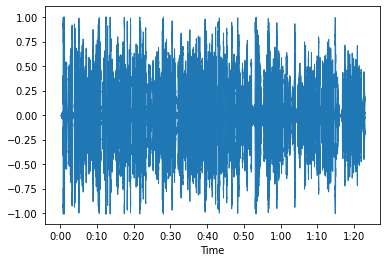

In [18]:
from librosa import display
display.waveshow(y, sr=sr)

In [ ]:
# Applying the Fourier Transform
spectrogram_data = librosa.stft(y)
print(spectrogram_data.shape)

# convert to decibels
decibels = librosa.amplitude_to_db(abs(spectrogram_data))

# Create the spectrogram
librosa.display.specshow(decibels)

In [ ]:
melspect = librosa.feature.melspectrogram(y)

In [ ]:
melspect.shape

# 2 - Feature extractor

In [3]:
with open("files.lst",'r') as filesFile:
    for featureFile in filesFile:
        print(featureFile)
        y, sfreq = sf.read(f'{featureFile}')
        #mf = mfsc(y, sfreq)
        #with open('{}.pickle'.format(featureFile[:-5]), 'wb') as handle:
        #    pickle.dump(mf,handle)

audiosPath/audio1


In [4]:
y, sfreq

(array([ 0.        ,  0.        ,  0.        , ..., -0.00537109,
        -0.0050354 , -0.00497437]),
 48000)

In [5]:
sfr = 48000

window_size=0.025
window_stride=0.010
window='hamming'
n_mels=80
preemCoef=0.97

win_length = int(sfr * window_size)
hop_length = int(sfr * window_stride)
n_fft = 512
lowfreq = 0
highfreq = sfr/2

print(len(y))
print(np.mean(y))
print(np.std(y))
print(np.median(y))

# melspectrogram
y *= 32768

print("-"*50)

print(len(y))
print(np.mean(y))
print(np.std(y))
print(np.median(y))

y[1:] = y[1:] - preemCoef*y[:-1]
y[0] *= (1 - preemCoef)

print("-"*50)

print(len(y))
print(np.mean(y))
print(np.std(y))
print(np.median(y))

3977280
-8.892205419654733e-06
0.12959739770018003
-0.000640869140625
--------------------------------------------------
3977280
-0.2913797871912463
4246.647527839499
-21.0
--------------------------------------------------
3977280
-0.008781146914473943
446.01487505325645
-0.9800000000000182


In [6]:
n_fft

512

In [7]:
hop_length

480

In [8]:
win_length

1200

In [9]:
S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, window=window, center=False)

In [10]:
D = np.abs(S)
param = librosa.feature.melspectrogram(S=D, sr=sfr, n_mels=n_mels, fmin=lowfreq, fmax=highfreq, norm=None)
mf = np.log(np.maximum(1, param))

In [14]:
mf.shape

(80, 8285)